# Query for Spectraction Results in OGA

 work with Weakly_2023_40
- use jupyter kernel LSST
- author : Sylvie Dagoret-Campagne
- affiliation : IJCLab
- creation date : 2023/09/14
- last update : 2023/10/09

- Spectractor https://github.com/lsst/Spectractor/
- Spectractor Version 3.0


Implement

- add exposure info in hdf5 attribute to get azimuth



In [1]:
! eups list -s | grep LOCAL

analysis_tools        LOCAL:/home/d/dagoret/repos/repos_w_2023_40/analysis_tools 	setup
atmospec              LOCAL:/home/d/dagoret/repos/repos_w_2023_40/atmospec 	setup
eups                  LOCAL:/opt/lsst/software/stack/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-7.0.1/eups 	setup
spectractor           LOCAL:/home/d/dagoret/repos/repos_w_2023_40/Spectractor 	setup


In [2]:
! eups list -s lsst_distrib

   g4213664e8e+7835acb1bb 	current w_2023_40 setup


In [3]:
import h5py

In [4]:
import lsst.daf.butler as dafButler
#import lsst.summit.utils.butlerUtils as butlerUtils

In [5]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
import pandas as pd

import matplotlib.ticker                         # here's where the formatter is
import os
import re
import pandas as pd

plt.rcParams["figure.figsize"] = (4,3)
plt.rcParams["axes.labelsize"] = 'xx-large'
plt.rcParams['axes.titlesize'] = 'xx-large'
plt.rcParams['xtick.labelsize']= 'xx-large'
plt.rcParams['ytick.labelsize']= 'xx-large'

In [6]:
from astropy.time import Time
import astropy.units as u

## Config

In [7]:
FLAG_MOUNT_ERRORS= False

### Butler

In [8]:
#repo =  "/sdf/group/rubin/repo/main"
repo = "/sdf/group/rubin/repo/oga/"
#repo = "/repo/embargo/"
butler = dafButler.Butler(repo)
registry = butler.registry

## User collections

In [9]:
DateToRuncollection_emptyholo4003_rebin2 = {

# September 2023    
  20230912 : 'u/dagoret/spectro/emptyholo4003noflat/runs_20230912', #spectractor V2.5
  20230913 : 'u/dagoret/spectro/emptyholo4003noflat/runs_20230913', #spectractor V2.5
  20230914 : 'u/dagoret/spectro/emptyholo4003noflat/runs_20230914', #spectractor V2.5
  20230926 : 'u/dagoret/spectro/emptyholo4003noflat/runs_20230926', #spectractor V2.5
  #20230927 : 'u/dagoret/spectro/emptyholo4003noflat_block102/runs_20230927', 
  20230927 : 'u/dagoret/BPS_manyspectro_v156', #spectractor V2.5  
  #20230928 : 'u/dagoret/spectro/emptyholo4003noflat_block102/runs_20230928', # interactive
  20230928 : 'u/dagoret/BPS_manyspectro_v158', # batch #spectractor V2.5
    
}

DateToRuncollection_emptyholo4003_rebin1 = {

# September 2023    
  20230927 : 'u/dagoret/BPS_manyspectro_v157', #spectractor V2.5  
  #20230928 : 'u/dagoret/BPS_manyspectro_v159', # batch Spectractor v2.5
  20230928 : 'u/dagoret/BPS_manyspectro_v161', # batch Spectractor v3.0  
    
}

DateToRuncollection_emptyholo4001_rebin2 = {

# September 2023    
  20230912 : 'u/dagoret/spectro/emptyholo4001noflat/runs_20230912', #spectractor V2.5
  20230913 : 'u/dagoret/spectro/emptyholo4001noflat/runs_20230913', #spectractor V2.5
  20230914 : 'u/dagoret/spectro/emptyholo4001noflat/runs_20230914', #spectractor V2.5
    
}


DateToRuncollection_collimatorholo4003_rebin2 = {
    20230912 : 'u/dagoret/spectro/collimatorholo4003noflat/runs_20230912', #spectractor V2.5
    20230913 : 'u/dagoret/spectro/collimatorholo4003noflat/runs_20230913', #spectractor V2.5
    20230914 : 'u/dagoret/spectro/collimatorholo4003noflat/runs_20230914', #spectractor V2.5
}

## Working mode

### Date

In [10]:
MODE_REBIN = 1
#DATE = 20230926
DATE = 20230928
#DATE = 20230927
filterdispersername = "empty~holo4_003"
#filterdispersername = "empty~holo4_001"
#filterdispersername = "collimator~holo4_003"

if MODE_REBIN == 2 and filterdispersername == "empty~holo4_003":
    my_collection = DateToRuncollection_emptyholo4003_rebin2[DATE]
elif MODE_REBIN == 2 and filterdispersername == "empty~holo4_001":
    my_collection = DateToRuncollection_emptyholo4001_rebin2[DATE]
elif MODE_REBIN == 2 and filterdispersername == "collimator~holo4_003":
    my_collection = DateToRuncollection_collimatorholo4003_rebin2[DATE]
elif MODE_REBIN == 1:
     my_collection = DateToRuncollection_emptyholo4003_rebin1[DATE] 
else:
    my_collection = None



## Output path at USDF

In [11]:
output_path = "/home/d/dagoret/rubin-user/DATA/AuxtelData2023/ExtractedSpectra/2023-09"
output_path = "."

# List of Dataset types avalaible in my collection

## List of dataset types

In [12]:
list(registry.queryDatasetTypes("*spec*"))

[DatasetType('atmospecCentroid', {band, instrument, detector, physical_filter, visit}, StructuredDataDict),
 DatasetType('spectraction', {band, instrument, detector, physical_filter, visit}, Spectraction),
 DatasetType('spectractorImage', {band, instrument, detector, physical_filter, visit}, SpectractorImage),
 DatasetType('spectractorSpectrum', {band, instrument, detector, physical_filter, visit}, SpectractorSpectrum),
 DatasetType('spectrogramLibradtranFitParameters', {band, instrument, detector, physical_filter, visit}, SpectractorFitParameters),
 DatasetType('spectrumForwardModelFitParameters', {band, instrument, detector, physical_filter, visit}, SpectractorFitParameters),
 DatasetType('spectrumLibradtranFitParameters', {band, instrument, detector, physical_filter, visit}, SpectractorFitParameters)]

## list of datasets

In [13]:
list(registry.queryDatasets("*spec*", collections=[my_collection]))[:10]

[DatasetRef(DatasetType('atmospecCentroid', {band, instrument, detector, physical_filter, visit}, StructuredDataDict), {instrument: 'LATISS', detector: 0, visit: 2023092800169, ...}, run='u/dagoret/BPS_manyspectro_v161/20231006T132237Z', id=e1ec4edf-aa9b-422f-804f-956ae0503667),
 DatasetRef(DatasetType('atmospecCentroid', {band, instrument, detector, physical_filter, visit}, StructuredDataDict), {instrument: 'LATISS', detector: 0, visit: 2023092800160, ...}, run='u/dagoret/BPS_manyspectro_v161/20231006T132237Z', id=79db5f63-9f7f-48ee-9306-6d590d5020d1),
 DatasetRef(DatasetType('atmospecCentroid', {band, instrument, detector, physical_filter, visit}, StructuredDataDict), {instrument: 'LATISS', detector: 0, visit: 2023092800235, ...}, run='u/dagoret/BPS_manyspectro_v161/20231006T132237Z', id=7ffbaa69-1a5b-4100-9f3a-37745cf56861),
 DatasetRef(DatasetType('atmospecCentroid', {band, instrument, detector, physical_filter, visit}, StructuredDataDict), {instrument: 'LATISS', detector: 0, visit

In [14]:
print(butler.registry.dimensions["exposure"].RecordClass.fields)

exposure: 
  instrument: str
  id: int
  physical_filter: str
  obs_id: str
  exposure_time: float
  dark_time: float
  observation_type: str
  observation_reason: str
  day_obs: int
  seq_num: int
  seq_start: int
  seq_end: int
  group_name: str
  group_id: int
  target_name: str
  science_program: str
  tracking_ra: float
  tracking_dec: float
  sky_angle: float
  azimuth: float
  zenith_angle: float
  has_simulated: bool
  timespan: lsst.daf.butler.Timespan


In [15]:
#where_clause = f"instrument=\'LATISS\' AND exposure.day_obs={DATE} AND exposure.science_program=\'spec\'"
where_clause = f"instrument=\'LATISS\' AND exposure.day_obs={DATE} AND exposure.science_program=\'SITCOM-1001\'"


In [16]:
where_clause

"instrument='LATISS' AND exposure.day_obs=20230928 AND exposure.science_program='SITCOM-1001'"

In [17]:
results_exposures = registry.queryDimensionRecords('exposure',datasets="raw",collections = 'LATISS/raw/all',where=where_clause)

In [18]:
#results_exposures = registry.queryDimensionRecords('exposure',datasets="raw",collections = 'LATISS/raw/all',where= "instrument='LATISS' AND exposure.day_obs=20230718 AND exposure.science_program='spec'")

In [19]:
list_exposures_attrib = list(results_exposures)
dict_exposure = {}
for element in list_exposures_attrib:
    element_id = element.id
    #print(f'--------- {element_id} -------')
    #print(element.toDict())
    dict_exposure[element_id] = element

In [20]:
#dict_exposure

### Spectractor

In [21]:
if MODE_REBIN == 2:
    configmode = "PSF2DFFM_REBIN2"
else:
    configmode = "PSF2DFFM_REBIN1"

specver="specV3.0"

https://www.pythonforthelab.com/blog/how-to-use-hdf5-files-in-python/

In [22]:
#summary_file = f"summaryspectra_{DATE}-{filterdispersername}-{configmode}-oga.csv"
summary_file = f"summaryspectra_{DATE}-{filterdispersername}-{configmode}-{specver}-oga.csv"
output_file_h5 = f"allspectra_{DATE}-{filterdispersername}-{configmode}-{specver}-oga.hdf5"

In [23]:
fullpath_output_file_h5 = os.path.join(output_path,output_file_h5)
fullpath_summary_file = os.path.join(output_path,summary_file)

### The collection

In [24]:
datasetRefs = registry.queryDatasets(datasetType='spectractorSpectrum', collections=my_collection, where= "instrument='LATISS'")

In [25]:
# following line not possible in OGA
#butler = butlerUtils.makeDefaultLatissButler(extraCollections=[my_collection])

In [26]:
if FLAG_MOUNT_ERRORS:
    df_mounterrors = pd.read_csv("mountErrors.csv")
    df=df_mounterrors[df_mounterrors["date_obs"] == DATE ]
    if len(df) == 0:
        FLAG_MOUNT_ERRORS = False
        

## Loop on exposures

In [27]:
#outfile.close()

In [28]:
all_dataId = []     # full data id
all_spec = []       # spectra
all_exposures = []  # exposure number
all_num = []        # sequence numbers
all_h5group = []

#hf_outfile =  h5py.File(output_file_h5, 'w')
hf_outfile =  h5py.File(fullpath_output_file_h5, 'w') 
  

for i, ref in enumerate(datasetRefs):

    print(f"============= ({i}) ============datasetType = spectraction ============================================")
    print("fullId..................:",ref.dataId.full)
    print("visit...................:",ref.dataId["visit"])
    print("band....................:",ref.dataId["band"])
    print("physical filter.........:",ref.dataId["physical_filter"])
    print("run.....................:",ref.run)
    
    #through old runs
    date_of_run = int(ref.run.split("/")[-1].split("T")[0])
    
 
    
    
    the_exposure = ref.dataId["visit"]
    the_day_obs = ref.dataId["visit"]//100_000
    the_seq_num = ref.dataId["visit"]- the_day_obs*100_000    
    the_dataId = {'day_obs': the_day_obs,'seq_num':the_seq_num,'detector':0}
    print(the_dataId)
    
    
    #print(dict_exposure[the_exposure])
    
    the_exposure_key = str(the_exposure)
    
    if the_exposure not in all_exposures:
        g = hf_outfile.create_group(the_exposure_key)
        all_h5group.append(g) 
    else:
        print(f">>>>>>  already existing key {the_exposure_key} Skip it !!! ")
        the_exposure_key = the_exposure_key + "_b"
        continue
   
    
    # retrieve the spectrum from Butler
    #spec       = butler.get('spectraction',the_dataId)
    spec = butler.get('spectractorSpectrum', visit=the_exposure, detector=0, collections=my_collection, instrument='LATISS')
    
    try:
        specLibradtranfit = butler.get('spectrumLibradtranFitParameters', visit=the_exposure, detector=0, collections=my_collection, instrument='LATISS')
    except Exception as e:
        msg = f"accessing spectrumLibradtranFitParameters failed got exception {e}"
        print(msg)
        
    try:     
        specForwardMfit = butler.get('spectrumForwardModelFitParameters', visit=the_exposure, detector=0, collections=my_collection, instrument='LATISS')
    except Exception as e:
        msg = f"accessing spectrumForwardModelFitParameters failed got exception {e}"
        print(msg)
    
    # save in collection lists
    all_dataId.append(the_dataId) 
    all_exposures.append(the_exposure)
    all_spec.append(spec)
    all_num.append(the_seq_num)
    

============= (0) ============datasetType = spectraction ============================================
fullId..................: {band: 'white', instrument: 'LATISS', detector: 0, physical_filter: 'empty~holo4_003', visit: 2023092800243}
visit...................: 2023092800243
band....................: white
physical filter.........: empty~holo4_003
run.....................: u/dagoret/BPS_manyspectro_v161/20231006T132237Z
{'day_obs': 20230928, 'seq_num': 243, 'detector': 0}
accessing spectrumLibradtranFitParameters failed got exception Dataset spectrumLibradtranFitParameters with data ID {instrument: 'LATISS', detector: 0, visit: 2023092800243} could not be found in collections u/dagoret/BPS_manyspectro_v161.
============= (1) ============datasetType = spectraction ============================================
fullId..................: {band: 'white', instrument: 'LATISS', detector: 0, physical_filter: 'empty~holo4_003', visit: 2023092800234}
visit...................: 2023092800234
band.

In [29]:
hf_outfile.keys()

<KeysViewHDF5 ['2023092800176', '2023092800177', '2023092800184', '2023092800185', '2023092800193', '2023092800222', '2023092800227', '2023092800234', '2023092800242', '2023092800243', '2023092800250', '2023092800251', '2023092800258', '2023092800259', '2023092800274', '2023092800283', '2023092800299', '2023092800306', '2023092800307', '2023092800332', '2023092800333', '2023092800340', '2023092800348', '2023092800349', '2023092800356', '2023092800357', '2023092800364', '2023092800365']>

In [30]:
index = 0

spec = all_spec[index]

In [31]:
the_h5group = all_h5group[index] 

In [32]:
d = the_h5group.create_dataset('airmass', data=spec.airmass)

In [33]:
spec.airmass

1.46744849970253

In [34]:
spec.date_obs

'2023-09-29T02:45:10.691498076Z'

In [35]:
spec.cov_matrix.shape

(2273, 2273)

In [36]:
spec.lambdas.shape

(2273,)

In [37]:
spec.data_next_order.shape

(2273,)

In [38]:
#spec.chromatic_psf.load_table()
spec.chromatic_psf.table

lambdas,Dx,Dy,Dy_disp_axis,flux_sum,flux_integral,flux_err,fwhm,Dy_fwhm_sup,Dy_fwhm_inf,amplitude,x_c,y_c,gamma,alpha,saturation
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
302.45902835188,841.8414263861648,4.200511738085595,2.9385866966920005,3.542224645614624,1.0,3.7673254054777225,15.201178897769466,-1.0574970193961235,-17.96204506388858,1.0,-0.06033557308148829,18.862545316740267,11.98409534091892,2.0528296047696446,2833.333333333335
302.8188592420338,842.8414263861648,4.193567493183366,2.9420773621075553,4.062320396828886,1.0,3.7789851031877864,15.199524911114569,-1.038625969346695,-17.93674481253663,1.0,0.9399078532359226,18.94484049923298,11.986899833781136,2.0540253130104023,2833.333333333335
303.1786862063826,843.8414263861648,4.186629247430858,2.9455680275231106,0.8787697897740383,1.0,3.773585596175572,15.197870924459671,-1.0197686292482864,-17.911458271135704,1.0,1.940150266167052,19.02678277887634,11.98969717338344,2.0552192676681815,2833.333333333335
303.53850924947506,844.8414263861648,4.179697000828071,2.9490586929386655,1.423276424040086,1.0,3.775935114163647,15.196216937804774,-1.0009249991008407,-17.88618543968574,1.0,2.94039167158121,19.108374232070247,11.99248735972584,2.0564114687429824,2833.333333333335
303.8983283757974,845.8414263861648,4.172770753375062,2.952549358354221,4.194679056989257,1.0,3.7777899362425282,15.194562951149877,-0.9820950789044147,-17.86092631818679,1.0,3.940632075300414,19.18961691829344,11.995270392808333,2.0576019162348054,2833.333333333335
304.25814358978664,846.8414263861648,4.165850505071774,2.956040023769777,2.9100044569607646,1.0,3.779777410941912,15.192908964494979,-0.9632788686589802,-17.835680906638835,1.0,4.940871483108026,19.27051288359084,11.998046272630916,2.0587906101436495,2833.333333333335
304.6179548958176,847.8414263861648,4.158936255918235,2.9595306891853324,3.0664241624929858,1.0,3.7894055072311037,15.191254977840082,-0.944476368364537,-17.810449205041873,1.0,5.941109900740912,19.35106415721549,12.000814999193594,2.0599775504695153,2833.333333333335
304.97776229821056,848.8414263861648,4.152028005914417,2.9630213546008886,3.408336766136377,1.0,3.7872017082396177,15.189600991185182,-0.9256875780210851,-17.785231213395903,1.0,6.941347333893191,19.431272753565878,12.00357657249636,2.0611627372124026,2833.333333333335
305.3375658012245,849.8414263861648,4.145125755060349,2.9665120200164448,3.420924915768356,1.0,3.783419040014182,15.187947004530285,-0.9069124976286531,-17.76002693170095,1.0,7.941583788212029,19.511140670506762,12.00633099253922,2.0623461703723116,2833.333333333335


In [39]:
spec.spectrogram_saturation

2833.3333333333335

In [40]:
spec.chromatic_psf.plot_summary()

In [41]:
specForwardMfit

FitParameters(values=array([ 1.00000000e+00,  1.00000000e+00,  1.00000000e+00,  1.84583913e+02,
       -1.24653872e+00, -2.52957494e+00,  4.17247669e-01,  1.00000000e+00,
        2.32262132e+02,  7.43000000e+02,  7.94999981e+00,  1.13212506e+00,
        1.12069876e+03,  2.84000000e+02, -4.81402942e-13,  3.38037242e-04,
       -5.30009226e-03,  3.55965932e-02,  1.68356479e+01,  1.71167406e+00,
       -3.33387807e-02,  2.92650381e+00,  2.27613321e-01, -7.96850058e-03,
        2.83333333e+03,  1.12069876e+03,  2.84000000e+02, -4.81402942e-13,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  1.69450472e+01,
        1.47824539e+00, -1.36922881e-01,  2.95181521e+00,  1.73367730e-01,
       -1.61114547e-02,  2.83333333e+03,  1.12069876e+03,  2.84000000e+02,
       -4.81402942e-13,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        1.69450472e+01,  1.47824539e+00, -1.36922881e-01,  2.95181521e+00,
        1.73367730e-01, -1.61114547e-02,  2.83333333e+03]), labels=['A1', 'A2',

In [42]:
def DumpSpectrum(spec):
    print("--------------------------------------------")
    print("spec.target.label\t",spec.target.label)
    print("spec.filter_label\t",spec.filter_label)
    print("spec.airmass\t",spec.airmass)
    print("spec.date_obs\t",spec.date_obs)
    print("spec.temperature\t",spec.temperature)
    print("spec.pressure\t",spec.pressure)
    print("spec.humidity\t",spec.humidity)    
    #print("spec.ra\t",spec.ra)
    print("spec.dec\t",spec.dec)
    print("spec.hour_angle\t",spec.hour_angle)
    print("spec.parallactic_angle\t",spec.parallactic_angle)
    print("spec.camera_angle\t", spec.camera_angle)
    print("--------------------------------------------")
    print("spec.order\t",spec.order)
    print("spec.lambdas\t",spec.lambdas)
    print("spec.data\t",spec.data)
    print("spec.err\t",spec.err)
    print("spec.covmatrix\t",spec.cov_matrix)
    print("--------------------------------------------")
    print("spec.data_next_order\t",spec.data_next_order)
    print("spec.err_next_order\t",spec.err_next_order)

In [43]:
def AddDataSetsInGroup(spec,h5group):
  
    #spectrum

    h5group.attrs['spec_target_label'] = spec.target.label
    h5group.attrs['spec_filter_label'] = spec.filter_label
    h5group.attrs["spec_date_obs"] = spec.date_obs
    h5group.attrs["spec_airmass"] = spec.airmass 
    h5group.attrs["spec_temperature"] = spec.temperature
    h5group.attrs["spec_pressure"] = spec.pressure
    h5group.attrs["spec_humidity"] = spec.humidity
    h5group.attrs["spec_dec"] = spec.dec
    h5group.attrs["spec_hour_angle"] = spec.hour_angle
    h5group.attrs["spec_parallactic_angle"] = spec.parallactic_angle
    h5group.attrs["spec_camera_angle"] = spec.camera_angle
    h5group.attrs["spec_order"] = spec.order
    
    
    d = h5group.create_dataset("spec_lambdas",data=spec.lambdas,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_data",data=spec.data,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_err",data=spec.err,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_covmatrix",data=spec.cov_matrix,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_data_next_order",data=spec.data_next_order,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_err_next_order",data=spec.err_next_order,compression="gzip", compression_opts=9)
    
    # spectrogram
    
    d = h5group.create_dataset("spec_spectrogram",data=spec.spectrogram,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_spectrogram_bgd",data=spec.spectrogram_bgd,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_spectrogram_bgd_rms",data=spec.spectrogram_bgd_rms,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_spectrogram_err",data=spec.spectrogram_err,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_spectrogram_residuals",data=spec.spectrogram_residuals,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_spectrogram_fit",data=spec.spectrogram_fit,compression="gzip", compression_opts=9)
    
    
    h5group.attrs["spec_spectrogram_x0"]=spec.spectrogram_x0
    h5group.attrs["spec_spectrogram_y0"]=spec.spectrogram_y0
    h5group.attrs["spec_spectrogram_xmin"]=spec.spectrogram_xmin
    h5group.attrs["spec_spectrogram_xmax"]=spec.spectrogram_xmax
    h5group.attrs["spec_spectrogram_ymin"]=spec.spectrogram_ymin
    h5group.attrs["spec_spectrogram_ymax"]=spec.spectrogram_ymax
    h5group.attrs["spec_spectrogram_deg"]=spec.spectrogram_deg
    h5group.attrs["spec_spectrogram_saturation"]=spec.spectrogram_saturation      
    h5group.attrs["spec_spectrogram_Nx"]=spec.spectrogram_Nx
    h5group.attrs["spec_spectrogram_Ny"]=spec.spectrogram_Ny
    
    
    # header
    
    h5group.attrs["spec_header_target"]=spec.header["TARGET"]
    h5group.attrs["spec_header_redshift"]=spec.header["REDSHIFT"]
    h5group.attrs['spec_header_grating']=spec.header["GRATING"]
    h5group.attrs["spec_header_rotangle"]=spec.header["ROTANGLE"]
    h5group.attrs["spec_header_d2ccd"]=spec.header["D2CCD"]
    h5group.attrs["spec_header_lshift"]=spec.header["LSHIFT"]
    h5group.attrs["spec_header_parangle"]=spec.header["PARANGLE"]
    h5group.attrs["spec_header_targetx"]=spec.header["TARGETX"]
    h5group.attrs["spec_header_targety"]=spec.header["TARGETY"]
    h5group.attrs["spec_header_lbda_ref"]=spec.header["LBDA_REF"]
    h5group.attrs["spec_header_pixshift"]=spec.header["PIXSHIFT"]
    h5group.attrs["spec_header_psf_reg"]=spec.header["PSF_REG"]
    h5group.attrs["spec_header_trace_r"]=spec.header["TRACE_R"]   
    h5group.attrs["spec_header_chi2_fit"]=spec.header["CHI2_FIT"]   
    h5group.attrs["spec_header_a2_fit"]=spec.header["A2_FIT"]
    h5group.attrs["spec_header_am_fit"]=spec.header["AM_FIT"]
    h5group.attrs["spec_header_meanfwhm"]=spec.header["MEANFWHM"]
    h5group.attrs["spec_header_version"]=spec.header["VERSION"]
    h5group.attrs["spec_header_rebin"]=spec.header["REBIN"]
    h5group.attrs['spec_header_date-obs']=spec.header["DATE-OBS"]
    h5group.attrs["spec_header_exptime"]=spec.header["EXPTIME"]
    h5group.attrs["spec_header_airmass"]=spec.header["AIRMASS"] 
    h5group.attrs["spec_header_dec"]=spec.header["DEC"]
    h5group.attrs["spec_header_ha"]=spec.header["HA"]
    h5group.attrs["spec_header_outtemp"]=spec.header["OUTTEMP"] 
    h5group.attrs["spec_header_outpress"]=spec.header["OUTPRESS"] 
    h5group.attrs["spec_header_outhum"]=spec.header["OUTHUM"]
    h5group.attrs["spec_header_filter"]=spec.header["FILTER"]
    h5group.attrs["spec_header_cam_rot"]=spec.header["CAM_ROT"] 
    h5group.attrs["spec_header_s_x0"]=spec.header["S_X0"]
    h5group.attrs["spec_header_s_y0"]=spec.header["S_Y0"]
    h5group.attrs["spec_header_s_xmin"]=spec.header["S_XMIN"]      
    h5group.attrs["spec_header_s_xmax"]=spec.header["S_XMAX"]                                               
    h5group.attrs["spec_header_s_ymin"]=spec.header["S_YMIN"]      
    h5group.attrs["spec_header_s_ymax"]=spec.header["S_YMAX"]                                                                                                                  
    h5group.attrs["spec_header_s_nx"]=spec.header["S_NX"]
    h5group.attrs["spec_header_s_ny"]=spec.header["S_NY"]   
    h5group.attrs["spec_header_s_dec"]=spec.header["S_DEG"]  
    h5group.attrs["spec_header_s_sat"]=spec.header["S_SAT"]      
                                               
    

In [44]:
def AddMountErrorsInGroup(h5group,az_rms,el_rms,rot_rms,image_az_rms,image_el_rms,image_rot_rms):
    h5group.attrs["me_az_rms"]=az_rms
    h5group.attrs["me_el_rms"]=el_rms
    h5group.attrs["me_rot_rms"]=rot_rms
    h5group.attrs["me_image_az_rms"]=image_az_rms
    h5group.attrs["me_image_el_rms"]=image_el_rms
    h5group.attrs["me_image_rot_rms"]=image_rot_rms
        

In [45]:
def AddExposureInfoInGroup(expoinfo,h5group):
    """
    Add the following informations to hdf5
    {'instrument': 'LATISS', 
     'id': 2023072000256, 
     'physical_filter': 'empty~holo4_003', 
     'obs_id': 'AT_O_20230720_000256', 
     'exposure_time': 30.0, 
     'dark_time': 30.2367, 
     'observation_type': 'science', 
     'observation_reason': 'generic', 
     'day_obs': 20230720, 
     'seq_num': 256, 
     'seq_start': 256, 
     'seq_end': 256, 
     'group_name': '2023-07-21T02:37:11.700', 
     'group_id': 2698366317000000, 
     'target_name': 'HD185975', 
     'science_program': 'spec', 
     'tracking_ra': 307.76950795132393, 
     'tracking_dec': -87.4337852028312, 
     'sky_angle': 42.62309278535102, 
     'azimuth': 177.85543058634352, 
     'zenith_angle': 57.826045218956686, 
     'has_simulated': False, 
     'timespan': Timespan(begin=astropy.time.Time('2023-07-21 02:37:47.189004', scale='tai', format='iso'), end=astropy.time.Time('2023-07-21 02:38:17.426000', scale='tai', format='iso'))
     }
    """
    h5group.attrs["expo_instrument"] = expoinfo.instrument
    h5group.attrs["expo_id"] = expoinfo.id
    h5group.attrs["physical_filter"] = expoinfo.physical_filter
    h5group.attrs["obs_id"] = expoinfo.obs_id
    h5group.attrs["exposure_time"] = expoinfo.exposure_time
    h5group.attrs["dark_time"] = expoinfo.dark_time
    h5group.attrs["observation_type"] = expoinfo.observation_type
    h5group.attrs["observation_reason"] = expoinfo.observation_reason
    h5group.attrs["day_obs"] = expoinfo.day_obs    
    h5group.attrs["seq_num"] = expoinfo.seq_num
    h5group.attrs["group_name"] = expoinfo.group_name
    h5group.attrs["group_id"] = expoinfo.group_id
    h5group.attrs["target_name"] = expoinfo.target_name
    h5group.attrs["science_program"] = expoinfo.science_program
    h5group.attrs["tracking_ra"] = expoinfo.tracking_ra
    h5group.attrs["tracking_dec"] = expoinfo.tracking_dec
    h5group.attrs["sky_angle"] = expoinfo.sky_angle
    h5group.attrs["azimuth"] = expoinfo.azimuth
    h5group.attrs["zenith_angle"] = expoinfo.zenith_angle
    h5group.attrs["mjd"] = Time(expoinfo.timespan.begin.to_string()).mjd
    h5group.attrs["jd"] = Time(expoinfo.timespan.begin.to_string()).jd

    
   

In [46]:
def AddDataSetsInGroupAndIndexExposure(spec,h5group,index,exposure,expoinfo):

    h5group.attrs["index"]=index
    h5group.attrs["exposure"]=exposure
    
    AddDataSetsInGroup(spec,h5group)
    AddExposureInfoInGroup(expoinfo,h5group)

In [47]:
DumpSpectrum(spec)

--------------------------------------------
spec.target.label	 HD14943
spec.filter_label	 empty
spec.airmass	 1.46744849970253
spec.date_obs	 2023-09-29T02:45:10.691498076Z
spec.temperature	 7.82499980926514
spec.pressure	 743
spec.humidity	 37.2750015258789
spec.dec	 -51.0827863141972
spec.hour_angle	 -57.865492853949895
spec.parallactic_angle	 -86.78411294456671
spec.camera_angle	 267.20900424749533
--------------------------------------------
spec.order	 1
spec.lambdas	 [ 305.10964149  305.47178137  305.83391718 ... 1113.67627391 1114.02423476
 1114.37218629]
spec.data	 [-1.19067379e-15 -6.58780272e-17 -5.24674569e-15 ...  5.43320009e-15
  4.23832713e-15  1.35636212e-15]
spec.err	 [3.97069860e-15 3.01641731e-15 1.68562352e-15 ... 1.02359125e-15
 1.23147907e-15 1.66574598e-15]
spec.covmatrix	 [[1.57664464e-29 1.18241814e-29 5.79103060e-30 ... 3.18004368e-39
  4.77235594e-39 5.72635853e-39]
 [1.18241814e-29 9.09877466e-30 4.72057767e-30 ... 2.45781024e-39
  3.69181469e-39 4.43090294e

# Save all spectra in a single file

In [48]:
exposures_sorted = np.sort(all_exposures)

In [49]:
exposures_sorted

array([2023092800176, 2023092800177, 2023092800184, 2023092800185,
       2023092800193, 2023092800222, 2023092800227, 2023092800234,
       2023092800242, 2023092800243, 2023092800250, 2023092800251,
       2023092800258, 2023092800259, 2023092800274, 2023092800283,
       2023092800299, 2023092800306, 2023092800307, 2023092800332,
       2023092800333, 2023092800340, 2023092800348, 2023092800349,
       2023092800356, 2023092800357, 2023092800364, 2023092800365])

In [50]:
dict_exposure

{2023092800157: exposure.RecordClass(instrument='LATISS', id=2023092800157, physical_filter='empty~holo4_003', obs_id='AT_O_20230928_000157', exposure_time=5.0, dark_time=5.23642, observation_type='acq', observation_reason='acq', day_obs=20230928, seq_num=157, seq_start=157, seq_end=157, group_name='2023-09-29T01:02:09.191', group_id=2758789291910000, target_name='HD009051', science_program='SITCOM-1001', tracking_ra=22.191844848203054, tracking_dec=-24.340417681693452, sky_angle=337.44376495285275, azimuth=102.87996273439974, zenith_angle=61.381216298809356, has_simulated=False, timespan=Timespan(begin=astropy.time.Time('2023-09-29 01:04:10.620997', scale='tai', format='iso'), end=astropy.time.Time('2023-09-29 01:04:15.858000', scale='tai', format='iso'))),
 2023092800158: exposure.RecordClass(instrument='LATISS', id=2023092800158, physical_filter='empty~holo4_003', obs_id='AT_O_20230928_000158', exposure_time=5.0, dark_time=5.24053, observation_type='acq', observation_reason='acq', d

In [51]:
for idx,spec in enumerate(all_spec):   
    the_exposure = all_exposures[idx]
    the_sorted_index = np.where(exposures_sorted == the_exposure)[0][0]
    
    
    # here add in HDF5
    try:
        AddDataSetsInGroupAndIndexExposure(spec,all_h5group[idx],the_sorted_index,the_exposure,dict_exposure[the_exposure])
    except Exception as e:
        print(f"Caught an exception: {e} for index {idx}, exposure {the_exposure}")
        continue
    
    
    if FLAG_MOUNT_ERRORS:
        df_exp_selected = df[df["exposure"] == the_exposure]
        N = len(df_exp_selected)
        if (N)>0:
            az_rms = df_exp_selected["az_rms"].values[0]
            el_rms = df_exp_selected["el_rms"].values[0]
            rot_rms = df_exp_selected["rot_rms"].values[0]
            image_az_rms = df_exp_selected["image_az_rms"].values[0]
            image_el_rms = df_exp_selected["image_el_rms"].values[0]
            image_rot_rms = df_exp_selected["image_rot_rms"].values[0]
            AddMountErrorsInGroup(all_h5group[idx],az_rms,el_rms,rot_rms,image_az_rms,image_el_rms,image_rot_rms)
        else:
            print(f"No error mount for exposure {the_exposure}")
            AddMountErrorsInGroup(all_h5group[idx],-1.,-1.,-1.,-1.,-1.,-1.)
            

In [52]:
hf_outfile.keys()

<KeysViewHDF5 ['2023092800176', '2023092800177', '2023092800184', '2023092800185', '2023092800193', '2023092800222', '2023092800227', '2023092800234', '2023092800242', '2023092800243', '2023092800250', '2023092800251', '2023092800258', '2023092800259', '2023092800274', '2023092800283', '2023092800299', '2023092800306', '2023092800307', '2023092800332', '2023092800333', '2023092800340', '2023092800348', '2023092800349', '2023092800356', '2023092800357', '2023092800364', '2023092800365']>

In [53]:
#AddDataSetsInGroup(spec,the_h5group) # already done previously
hf_outfile.close() 

## Plot Spectra

- sequence order

In [54]:
rank = np.argsort(all_exposures)

In [55]:
NSPEC = len(all_exposures)

In [56]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

/tmp/ipykernel_5949/4265044068.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig=plt.figure(figsize=(16,4))


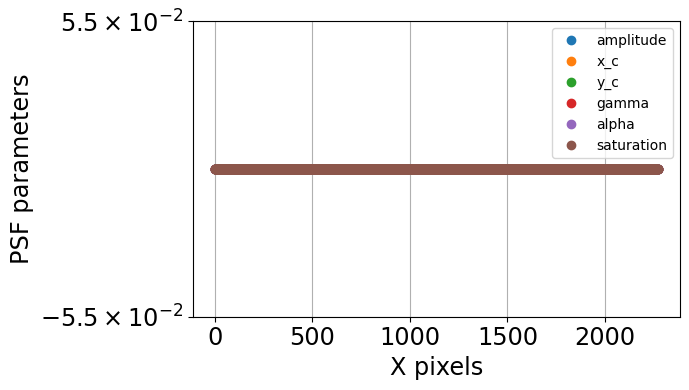

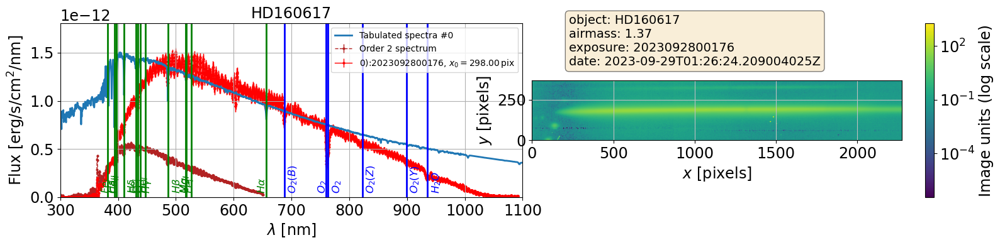

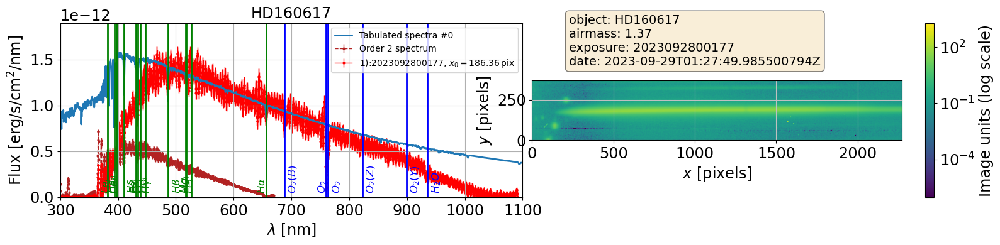

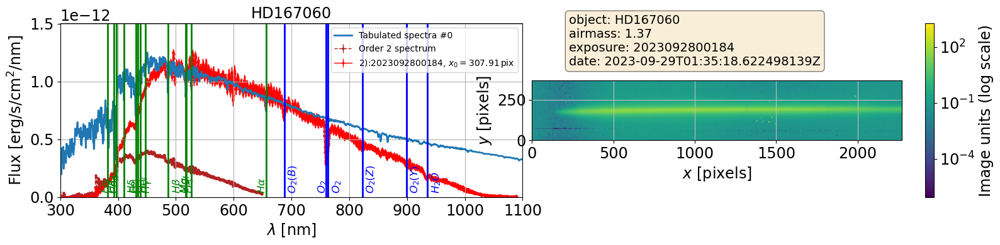

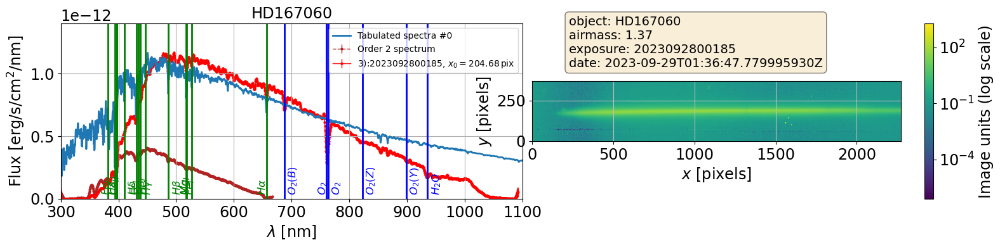

...

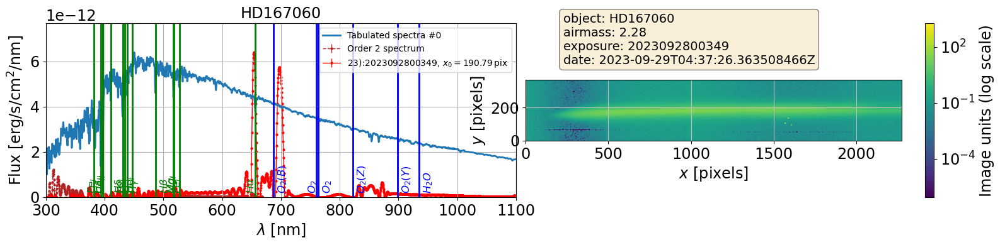

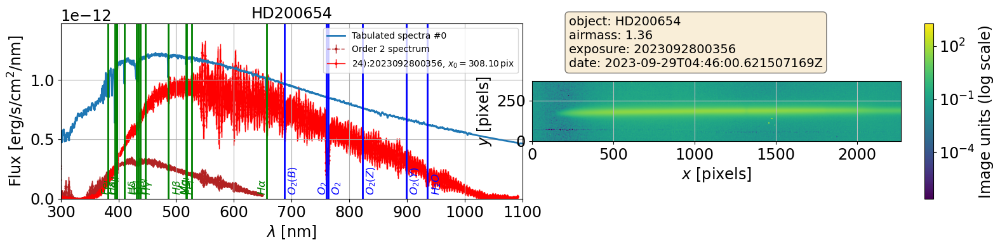

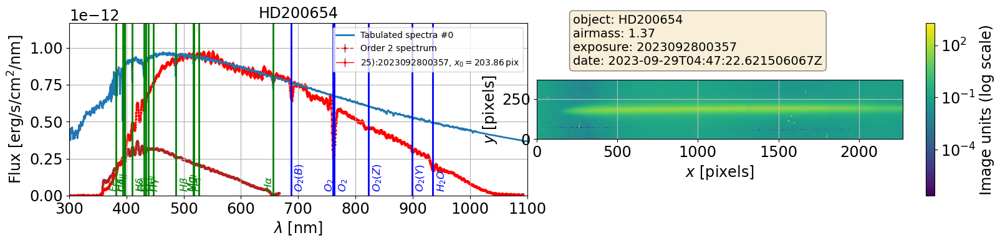

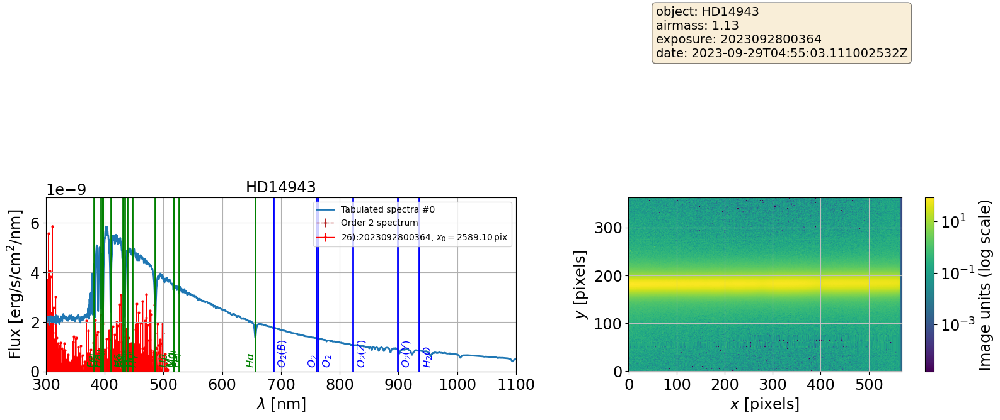

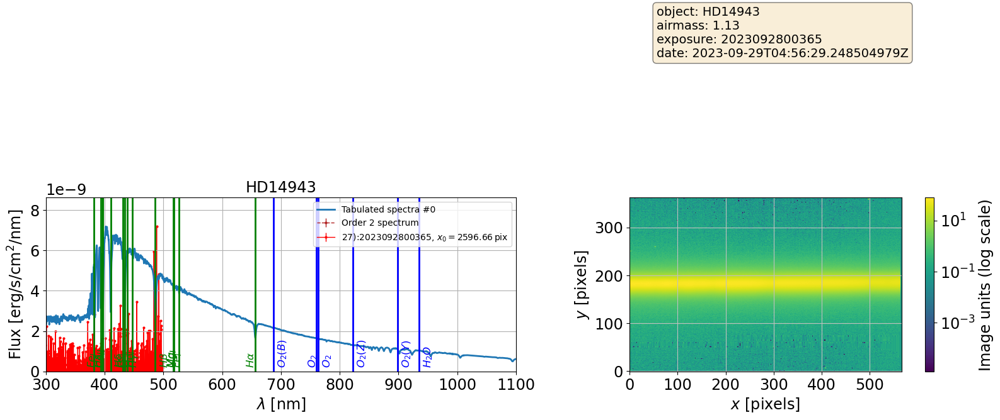

In [57]:
%matplotlib inline

infos = []
all_lambdas=[]
all_data=[]
all_data_err=[]
all_textstr = []



# loop on spectra
for index in range(NSPEC):
    
    idx = rank[index]
    s=all_spec[idx]
    label = str(index) +"):" + str(all_exposures[idx])
    the_expos = all_exposures[idx]
    
    try:
        fig=plt.figure(figsize=(16,4))
        
       
        textstr = '\n'.join((f"object: {s.target.label}", f"airmass: {s.airmass:.2f}",f"exposure: {the_expos}",f"date: {s.date_obs}"))
    
        ax1 = fig.add_subplot(1, 2, 1)
        s.plot_spectrum(ax=ax1,force_lines=True,label=label)
    
        ax2 = fig.add_subplot(1, 2, 2)
        s.plot_spectrogram(ax=ax2,scale="log")
        ax2.text(0.1, 2.1, textstr, transform=ax2.transAxes, fontsize=14,verticalalignment='top', bbox=props)
    
        all_lambdas.append(s.lambdas)
        all_data.append(s.data)
        all_data_err.append(s.err)
    
        #save info    
        infos.append([idx,s.target.label,s.date_obs,s.airmass,s.temperature,s.pressure,s.humidity])
        all_textstr.append(textstr)
        
        
            
    except Exception as inst:
        print(" >>> Exception catched for "+ label )
        print(type(inst))    # the exception instance
        print(inst.args)     # arguments stored in .args

    
    idx+=1

# Save plot in pdf file

In [58]:
from matplotlib.backends.backend_pdf import PdfPages

In [59]:
def SaveFigSpectraInPdf(nbspecperpage=5):
    
    Nspec= len(all_spec)
    Nbpages = np.ceil(Nspec/nbspecperpage)
    idx_inpage = nbspecperpage
    idx_pagenum = 0
    idx = 0
    
    all_composed_figs = []
    
    # loop on spectra
    for index in range(Nspec):  
        
        # get index on spectrum
        idx = rank[index]
        textstr = all_textstr[index]
   
        # if we need to start a new page
        if idx_inpage == nbspecperpage:
            idx_inpage = 1  # start at the first row in the page from 1 to nbspecperpage
            idx_pagenum += 1  # increase page counter
            
            # this trigger the saving of the whole figure (including all spectra of the page)
            if idx_pagenum > 1:
                plt.show()
                all_composed_figs.append(fig)
            
            # this create a new figure 
            fig=plt.figure(figsize=(16,20))
            
        # this is not a new page, need to increase the row number inside this page from 1 to nbspecperpage    
        else:
            idx_inpage += 1   
        
        # index of the figure in the page
        idx_fig = 2*(idx_inpage-1)+1
        
        print(f"\t \t  SaveFigSpectraInPdf >>>>>>>>  spec num = {index}, pagenum = {idx_pagenum}/{Nbpages}, idx_inpage = {idx_inpage}, idx_fig = {idx_fig}")        
       
    
        # Get the spectrum          
        s=all_spec[idx]
        label = str(index) +"):" + str(all_exposures[idx])
        
        # left image, two columns
        ax1 = fig.add_subplot(nbspecperpage, 2, idx_fig)
        s.plot_spectrum(ax=ax1,force_lines=True,label=label)
    
        #right image, to columns
        ax2 = fig.add_subplot(nbspecperpage, 2, idx_fig+1)
        s.plot_spectrogram(ax=ax2,scale="log")
        ax2.text(0.1, 2.1, textstr, transform=ax2.transAxes, fontsize=14,verticalalignment='top', bbox=props)
        
        
             
    all_composed_figs.append(fig)                          
    return  all_composed_figs
    


	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 0, pagenum = 1/6.0, idx_inpage = 1, idx_fig = 1
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 1, pagenum = 1/6.0, idx_inpage = 2, idx_fig = 3


/home/d/dagoret/repos/repos_w_2023_40/Spectractor/lib/python/spectractor/extractor/spectrum.py:445: UserWarning: The figure layout has changed to tight
  plt.gcf().tight_layout()


	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 2, pagenum = 1/6.0, idx_inpage = 3, idx_fig = 5
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 3, pagenum = 1/6.0, idx_inpage = 4, idx_fig = 7
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 4, pagenum = 1/6.0, idx_inpage = 5, idx_fig = 9


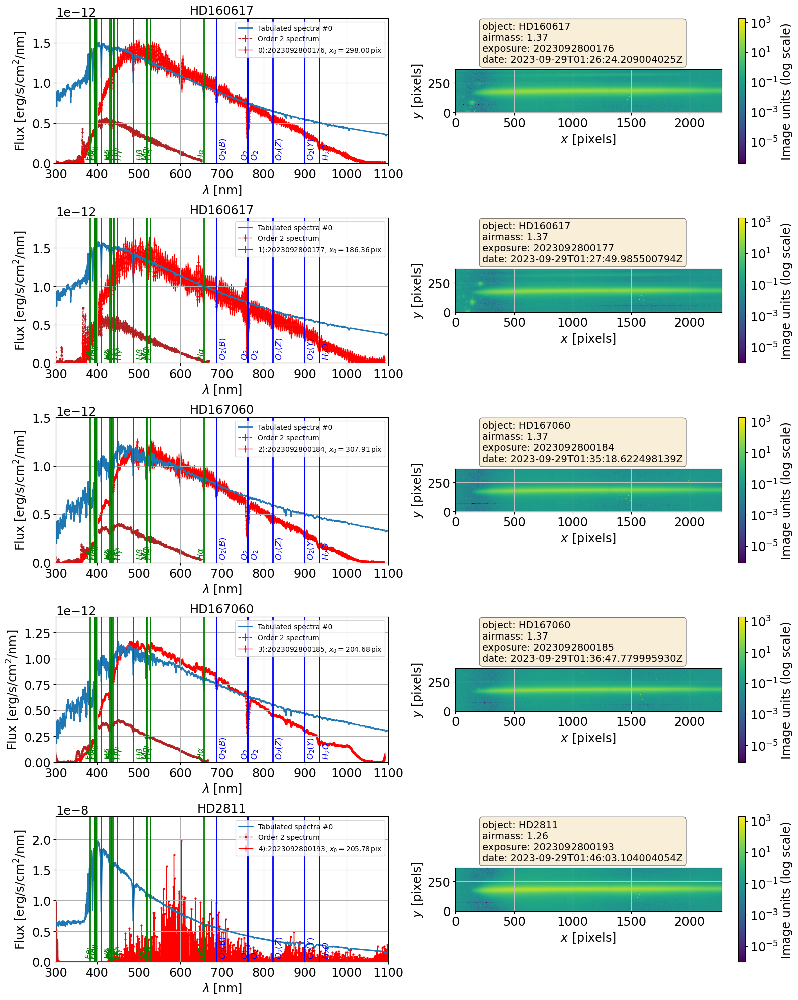

	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 5, pagenum = 2/6.0, idx_inpage = 1, idx_fig = 1
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 6, pagenum = 2/6.0, idx_inpage = 2, idx_fig = 3
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 7, pagenum = 2/6.0, idx_inpage = 3, idx_fig = 5
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 8, pagenum = 2/6.0, idx_inpage = 4, idx_fig = 7
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 9, pagenum = 2/6.0, idx_inpage = 5, idx_fig = 9


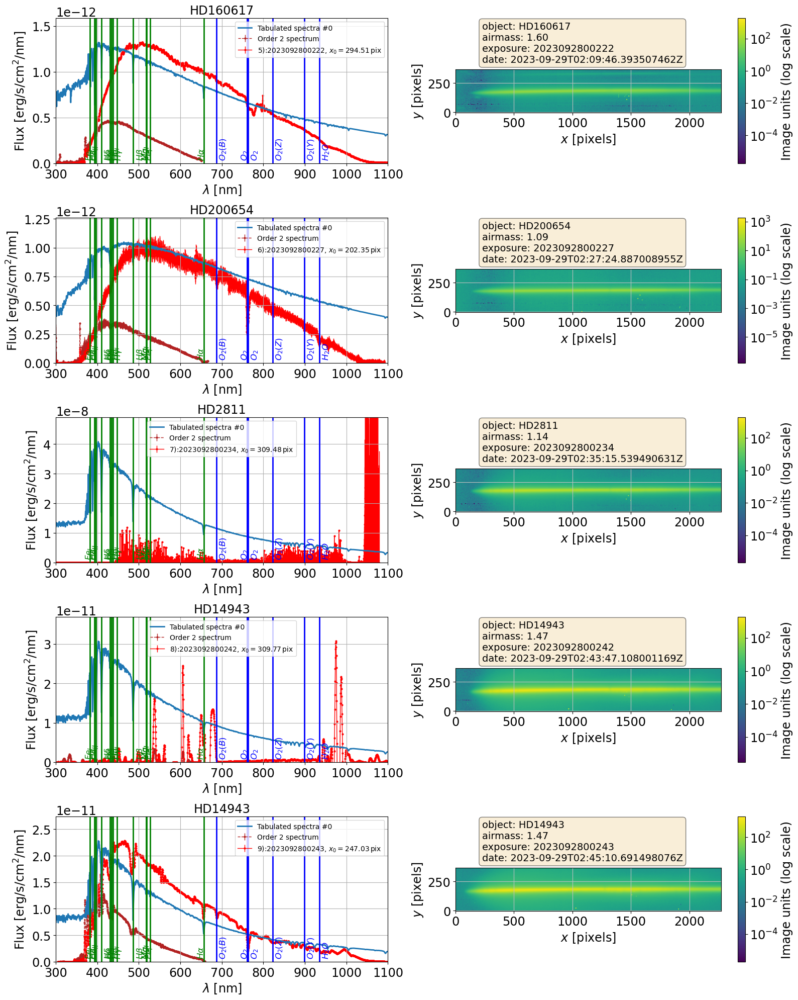

	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 10, pagenum = 3/6.0, idx_inpage = 1, idx_fig = 1
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 11, pagenum = 3/6.0, idx_inpage = 2, idx_fig = 3
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 12, pagenum = 3/6.0, idx_inpage = 3, idx_fig = 5
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 13, pagenum = 3/6.0, idx_inpage = 4, idx_fig = 7
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 14, pagenum = 3/6.0, idx_inpage = 5, idx_fig = 9


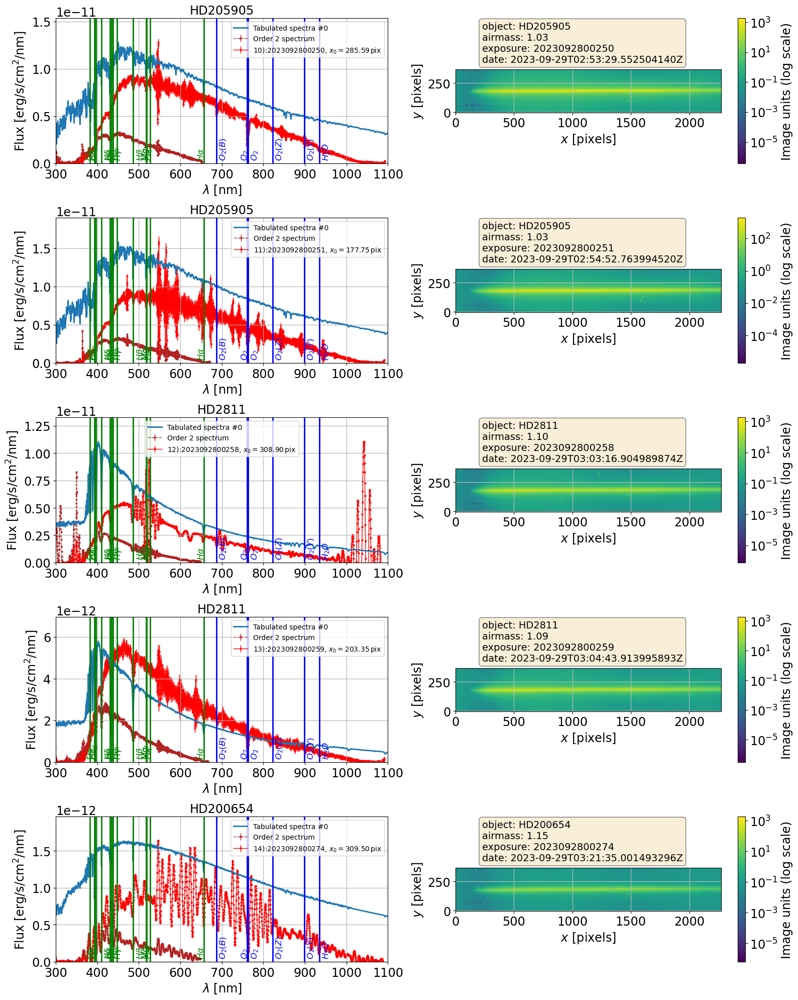

	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 15, pagenum = 4/6.0, idx_inpage = 1, idx_fig = 1
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 16, pagenum = 4/6.0, idx_inpage = 2, idx_fig = 3
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 17, pagenum = 4/6.0, idx_inpage = 3, idx_fig = 5
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 18, pagenum = 4/6.0, idx_inpage = 4, idx_fig = 7
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 19, pagenum = 4/6.0, idx_inpage = 5, idx_fig = 9


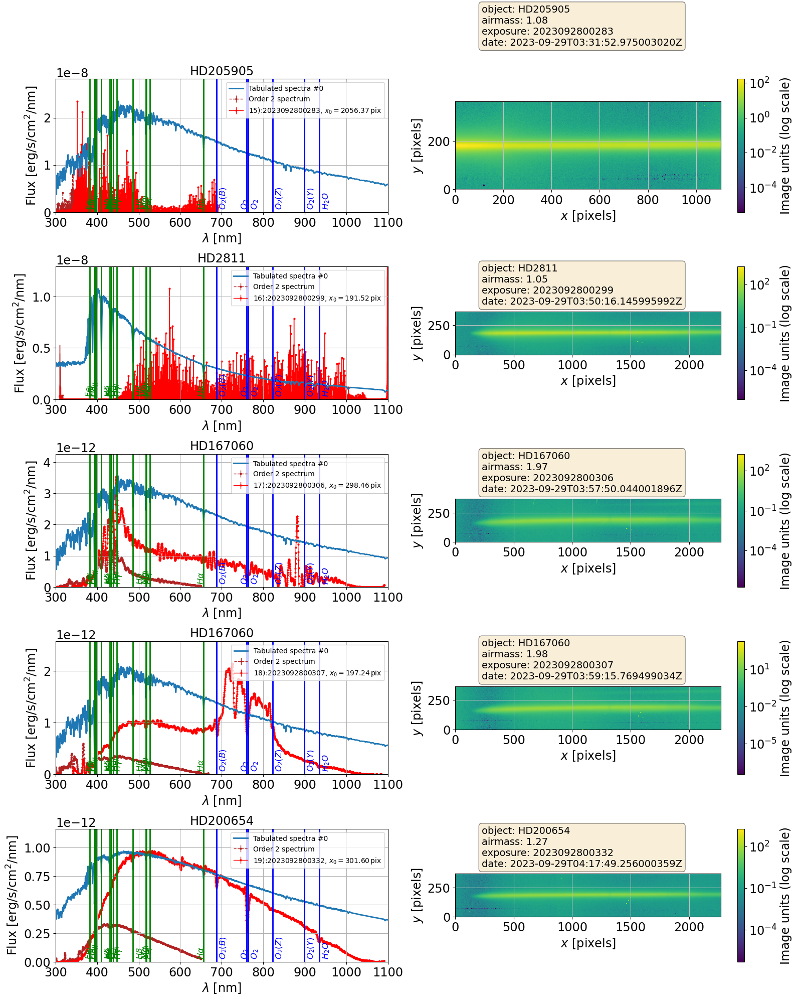

	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 20, pagenum = 5/6.0, idx_inpage = 1, idx_fig = 1
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 21, pagenum = 5/6.0, idx_inpage = 2, idx_fig = 3
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 22, pagenum = 5/6.0, idx_inpage = 3, idx_fig = 5
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 23, pagenum = 5/6.0, idx_inpage = 4, idx_fig = 7
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 24, pagenum = 5/6.0, idx_inpage = 5, idx_fig = 9


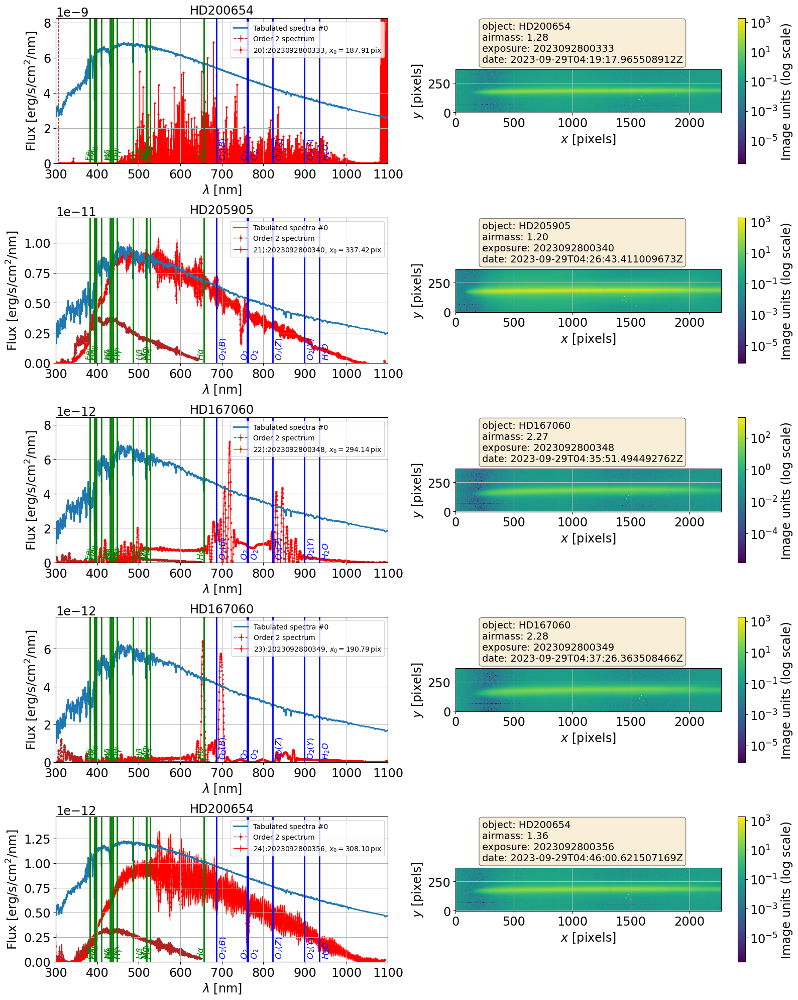

	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 25, pagenum = 6/6.0, idx_inpage = 1, idx_fig = 1
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 26, pagenum = 6/6.0, idx_inpage = 2, idx_fig = 3
	 	  SaveFigSpectraInPdf >>>>>>>>  spec num = 27, pagenum = 6/6.0, idx_inpage = 3, idx_fig = 5


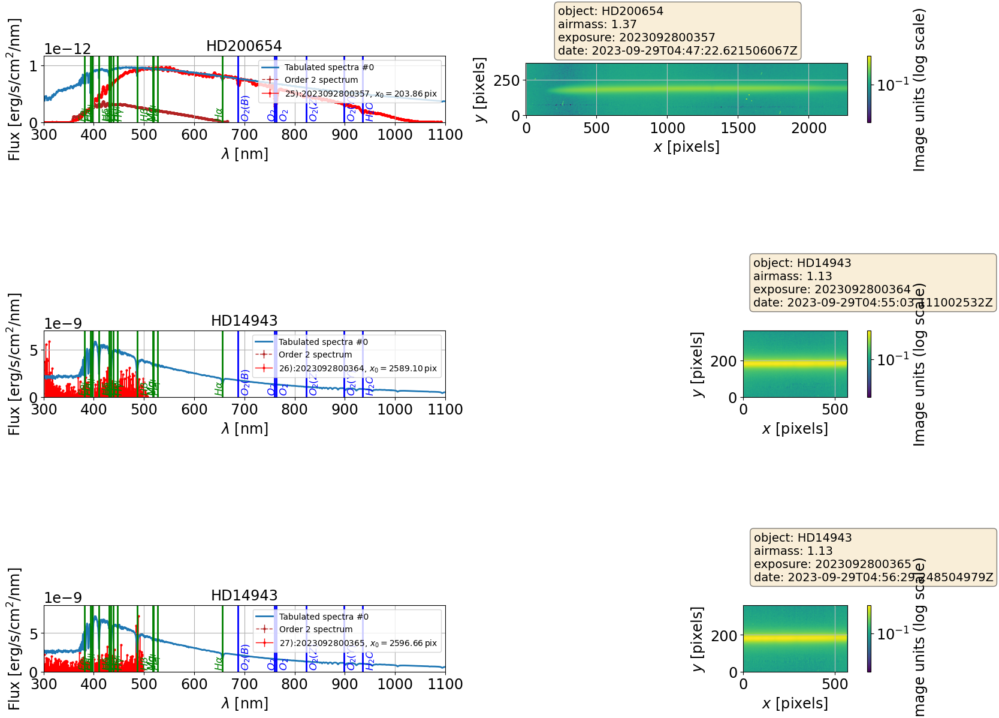

In [60]:
all_figs = SaveFigSpectraInPdf(nbspecperpage=5)

In [61]:
multipage_pdf_file = f'multipage_pdf_spectra_holo_{DATE}-{filterdispersername}-{configmode}-{specver}.pdf'

In [62]:
# gerate a multipage pdf:
with PdfPages(multipage_pdf_file) as pdf:
    for fig in all_figs:
        pdf.savefig(fig)
        plt.close()